In [1]:
!gdown --id 1IHdxHKthYDHcN_zx9Pxon2qKCtpdb2ni

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1IHdxHKthYDHcN_zx9Pxon2qKCtpdb2ni
To: /content/Aloe_images.zip
100% 1.32M/1.32M [00:00<00:00, 109MB/s]


In [2]:
!unzip Aloe_images.zip

Archive:  Aloe_images.zip
  inflating: Aloe/Aloe_left_1.png    
  inflating: Aloe/Aloe_right_3.png   
  inflating: Aloe/Aloe_right_1.png   
  inflating: Aloe/Aloe_right_2.png   
  inflating: Aloe/Disparity_map_corr.png  


In [3]:
import os
os.remove('./Aloe_images.zip')

In [4]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Problem 1

In [5]:
def pixel_wise_matching(left_img, right_img, disparity_range, compute_type='L1', save_result=True):
    print(f'Compute disparity map using pixel wise matching with {compute_type}...')
    image_L = cv.imread(left_img, 0).astype(np.float32)
    image_R = cv.imread(right_img, 0).astype(np.float32)

    height, width = image_L.shape
    scale = 255/disparity_range

    cost_map = np.full((height, width, disparity_range), 255)

    for d in range(disparity_range):
        cost_map[:,d:width,d] = image_R[:, 0:width-d]

    if compute_type == 'L1':
        cost_map = np.abs(cost_map-image_L.reshape(height, width, 1))
    elif compute_type == 'L2':
        cost_map = (cost_map-image_L.reshape(height, width, 1))**2
    
    disparity_map = np.uint8(np.argmin(cost_map, axis=2) * scale)
    color_disparity_map = cv.applyColorMap(disparity_map, cv.COLORMAP_JET)

    if save_result == True:
        print('Saving result...')
        cv.imwrite('disparity_map_1.png', disparity_map)
        cv.imwrite('color_disparity_map_1.png', color_disparity_map)
    else:
        ...
    
    print('Done')
    return disparity_map, color_disparity_map

In [6]:
left_img = './Aloe/Aloe_left_1.png'
right_img = './Aloe/Aloe_right_1.png'

Compute disparity map using pixel wise matching with L1...
Saving result...
Done


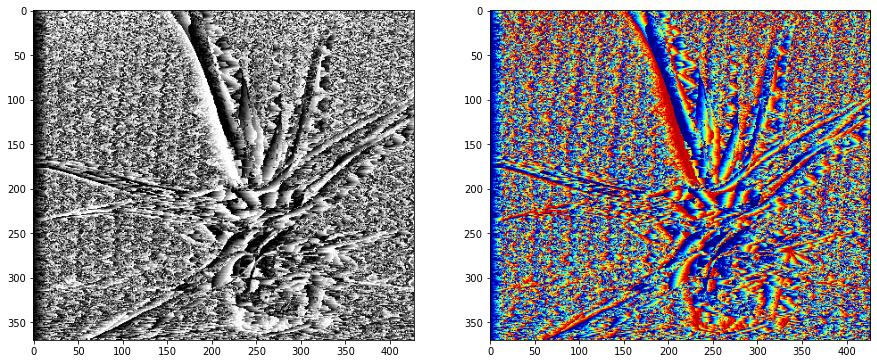

In [7]:
disparity_map, color_disparity_map = pixel_wise_matching(left_img, right_img, 16, compute_type='L1')
color_disparity_map = cv.cvtColor(color_disparity_map, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map)
plt.show()

Compute disparity map using pixel wise matching with L1...
Saving result...
Done


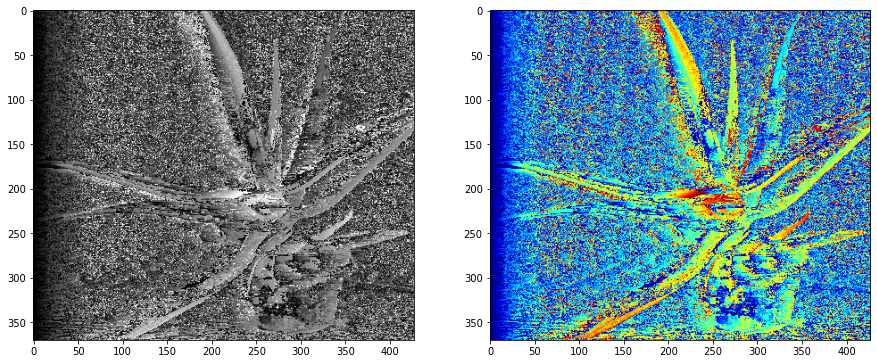

In [8]:
disparity_map, color_disparity_map = pixel_wise_matching(left_img, right_img, 64, compute_type='L1')
color_disparity_map = cv.cvtColor(color_disparity_map, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map)
plt.show()

Compute disparity map using pixel wise matching with L2...
Saving result...
Done


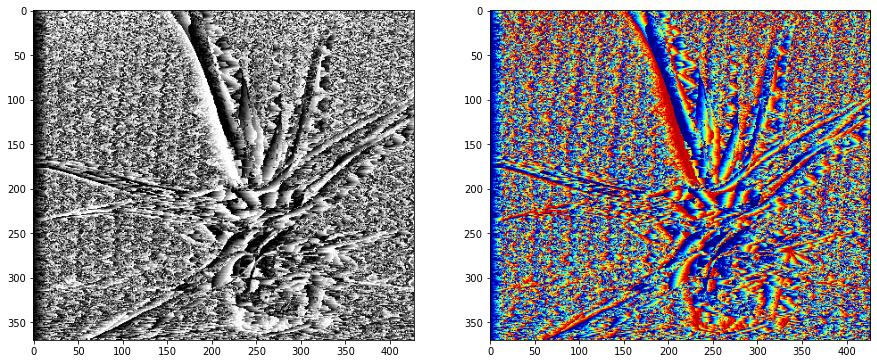

In [9]:
disparity_map, color_disparity_map = pixel_wise_matching(left_img, right_img, 16, compute_type='L2')
color_disparity_map = cv.cvtColor(color_disparity_map, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map)
plt.show()

Compute disparity map using pixel wise matching with L2...
Saving result...
Done


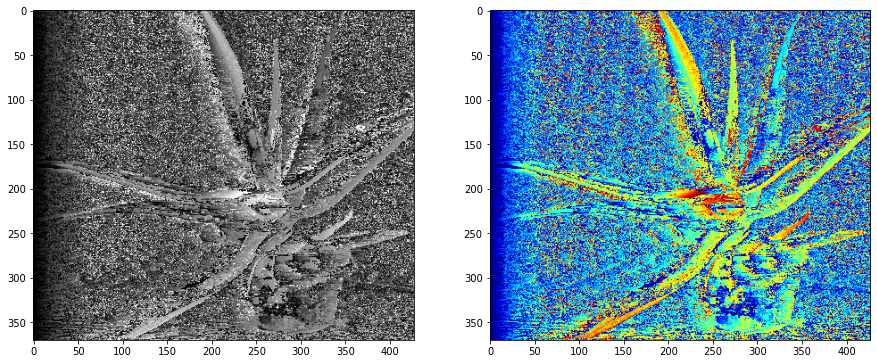

In [10]:
disparity_map, color_disparity_map = pixel_wise_matching(left_img, right_img, 64, compute_type='L2')
color_disparity_map = cv.cvtColor(color_disparity_map, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map)
plt.show()

# Problem 2

In [11]:
def compute_integral(array):
    integral = np.cumsum(array, axis=0)
    integral = np.cumsum(integral, axis=1)
    return integral

In [12]:
def window_based_matching(left_img, right_img, disparity_range, compute_type='L1', kernel_size=5, save_result=True):
    print(f'Compute disparity map using window based matching with {compute_type}...')
    image_L = cv.imread(left_img, 0).astype(np.float32)
    image_R = cv.imread(right_img, 0).astype(np.float32)

    height, width = image_L.shape
    scale = 255/disparity_range
    side = int((kernel_size - 1)/2)

    cost_map = np.full((height, width, disparity_range), 255)

    for d in range(disparity_range):
        cost_map[:,d:width,d] = image_R[:, 0:width-d]

    if compute_type == 'L1':
        cost_map = np.abs(cost_map-image_L.reshape(height, width, 1))
    elif compute_type == 'L2':
        cost_map = (cost_map-image_L.reshape(height, width, 1))**2

    integral = compute_integral(cost_map)
    integral = np.vstack((np.zeros((1, width, disparity_range)), integral))
    integral = np.hstack((np.zeros((height+1, 1, disparity_range)), integral))
    
    cost_map[0+side:height-side, 0+side:width-side, :] = integral[0+2*side+1:height+1, 0+2*side+1:width+1, :]
    cost_map[0+side:height-side, 0+side:width-side, :] -= integral[0:height-2*side, 0+2*side+1:width+1, :]
    cost_map[0+side:height-side, 0+side:width-side, :] -= integral[0+2*side+1:height+1, 0:width-2*side, :]
    cost_map[0+side:height-side, 0+side:width-side, :] += integral[0:height-2*side, 0:width-2*side, :]

    disparity_map = np.uint8(np.argmin(cost_map, axis=2) * scale)
    color_disparity_map = cv.applyColorMap(disparity_map, cv.COLORMAP_JET)

    if save_result == True:
        print('Saving result...')
        cv.imwrite('disparity_map_2.png', disparity_map)
        cv.imwrite('color_disparity_map_2.png', color_disparity_map)
    else:
        ...
    
    print('Done')
    return disparity_map, color_disparity_map

In [13]:
left_img = './Aloe/Aloe_left_1.png'
right_img = './Aloe/Aloe_right_1.png'

Compute disparity map using window based matching with L1...
Saving result...
Done


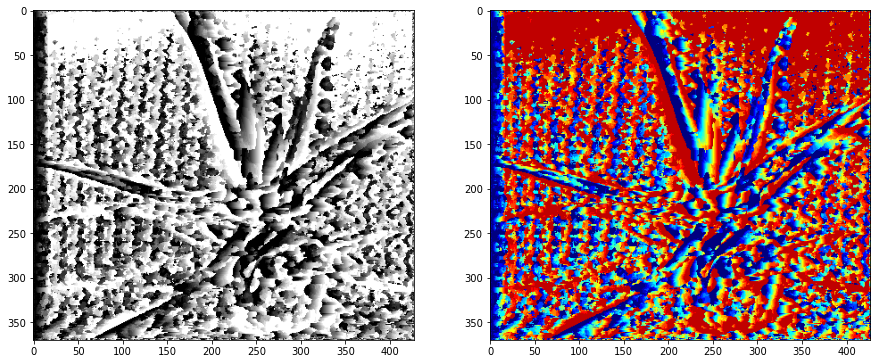

In [14]:
disparity_map2, color_disparity_map2 = window_based_matching(left_img, right_img, 16, compute_type='L1')
color_disparity_map2 = cv.cvtColor(color_disparity_map2, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map2, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map2)
plt.show()

Compute disparity map using window based matching with L1...
Saving result...
Done


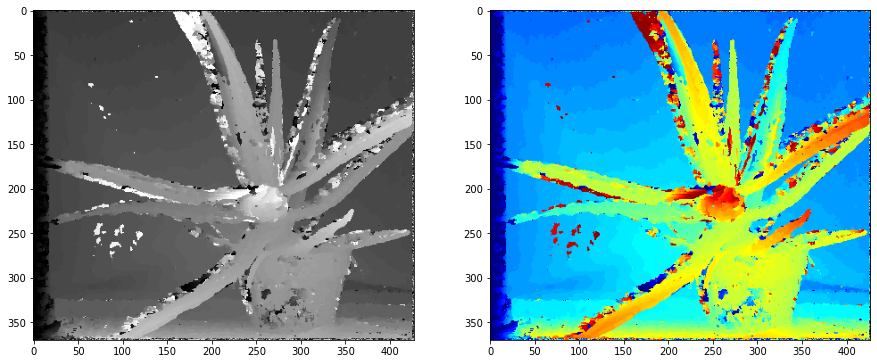

In [15]:
disparity_map2, color_disparity_map2 = window_based_matching(left_img, right_img, 64, compute_type='L1')
color_disparity_map2 = cv.cvtColor(color_disparity_map2, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map2, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map2)
plt.show()

Compute disparity map using window based matching with L2...
Saving result...
Done


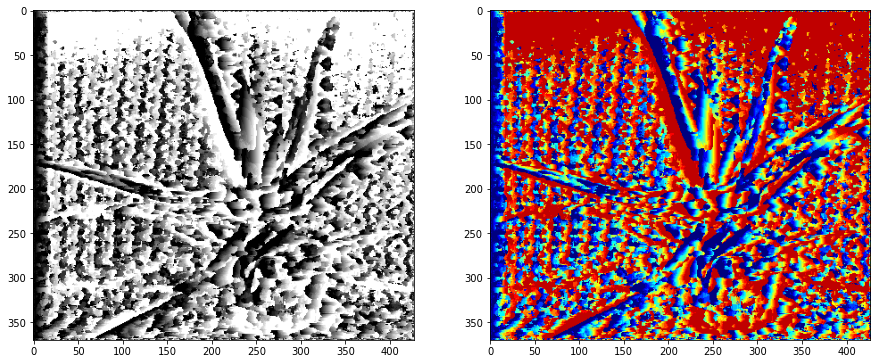

In [16]:
disparity_map2, color_disparity_map2 = window_based_matching(left_img, right_img, 16, compute_type='L2')
color_disparity_map2 = cv.cvtColor(color_disparity_map2, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map2, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map2)
plt.show()

Compute disparity map using window based matching with L2...
Saving result...
Done


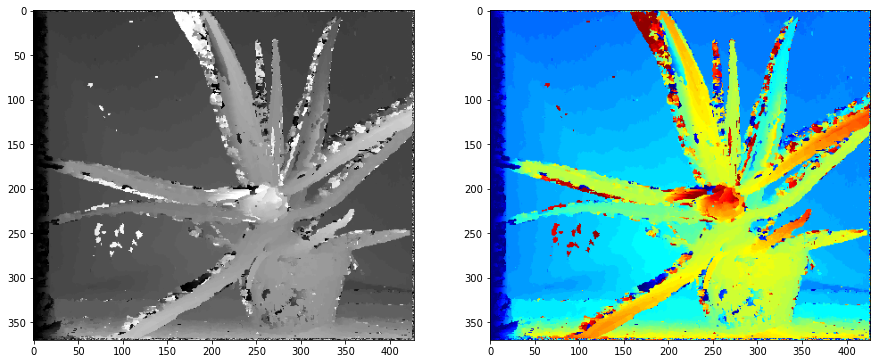

In [17]:
disparity_map2, color_disparity_map2 = window_based_matching(left_img, right_img, 64, compute_type='L2')
color_disparity_map2 = cv.cvtColor(color_disparity_map2, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map2, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map2)
plt.show()

# Problem 3

In [18]:
left_img = './Aloe/Aloe_left_1.png'
right_img = './Aloe/Aloe_right_2.png'

Compute disparity map using window based matching with L1...
Done


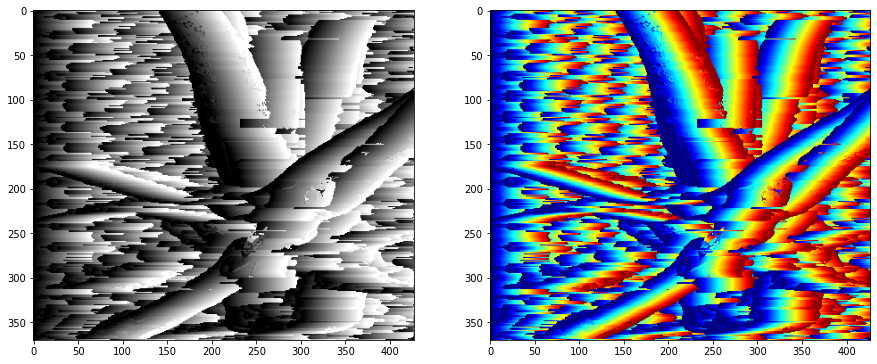

In [19]:
disparity_map3, color_disparity_map3 = window_based_matching(left_img, right_img, 64, compute_type='L1', kernel_size=3, save_result=False)
color_disparity_map3 = cv.cvtColor(color_disparity_map3, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map3, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map3)
plt.show()

Compute disparity map using window based matching with L2...
Done


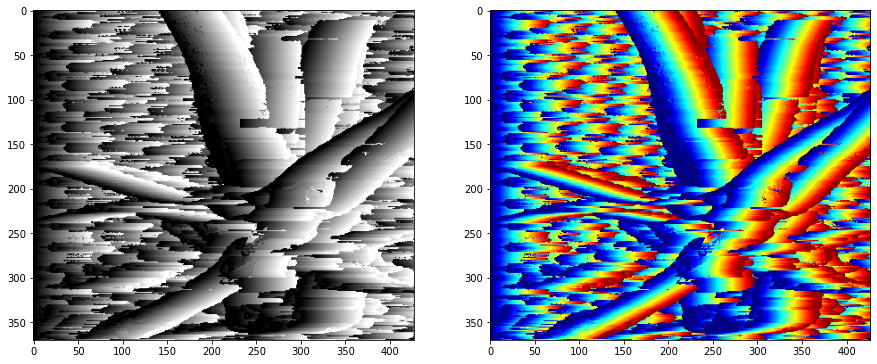

In [20]:
disparity_map3, color_disparity_map3 = window_based_matching(left_img, right_img, 64, compute_type='L2', kernel_size=3, save_result=False)
color_disparity_map3 = cv.cvtColor(color_disparity_map3, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map3, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map3)
plt.show()

# Problem 4

In [21]:
def compute_integral(array):
    integral = np.cumsum(array, axis=0)
    integral = np.cumsum(integral, axis=1)
    return integral

In [32]:
def window_based_matching_using_cosine(left_img, right_img, disparity_range, kernel_size=5, save_result=True):
    print('Compute disparity map using window based matching with cosine similarity...')
    image_L = cv.imread(left_img, 0).astype(np.float64)
    image_R = cv.imread(right_img, 0).astype(np.float64)

    height, width = image_L.shape
    scale = 255/disparity_range
    side = int((kernel_size - 1)/2)

    cost_map = np.full((height, width, disparity_range), 255, dtype=np.float64)

    for d in range(disparity_range):
        cost_map[:,d:width,d] = image_R[:, 0:width-d]

    XY = cost_map * image_L.reshape((height, width, 1))
    integral = compute_integral(XY)
    integral = np.vstack((np.zeros((1, width, disparity_range)), integral))
    integral = np.hstack((np.zeros((height+1, 1, disparity_range)), integral))
    XY[0+side:height-side, 0+side:width-side, :] = integral[0+2*side+1:height+1, 0+2*side+1:width+1, :]
    XY[0+side:height-side, 0+side:width-side, :] -= integral[0:height-2*side, 0+2*side+1:width+1, :]
    XY[0+side:height-side, 0+side:width-side, :] -= integral[0+2*side+1:height+1, 0:width-2*side, :]
    XY[0+side:height-side, 0+side:width-side, :] += integral[0:height-2*side, 0:width-2*side, :]

    XX = image_L * image_L
    integral = compute_integral(XX)
    integral = np.vstack((np.zeros((1, width)), integral))
    integral = np.hstack((np.zeros((height+1, 1)), integral))
    XX[0+side:height-side, 0+side:width-side] = integral[0+2*side+1:height+1, 0+2*side+1:width+1]
    XX[0+side:height-side, 0+side:width-side] -= integral[0:height-2*side, 0+2*side+1:width+1]
    XX[0+side:height-side, 0+side:width-side] -= integral[0+2*side+1:height+1, 0:width-2*side]
    XX[0+side:height-side, 0+side:width-side] += integral[0:height-2*side, 0:width-2*side]
    XX[0+side:height-side, 0+side:width-side] = np.sqrt(XX[0+side:height-side, 0+side:width-side])

    YY = cost_map * cost_map
    integral = compute_integral(YY)
    integral = np.vstack((np.zeros((1, width, disparity_range)), integral))
    integral = np.hstack((np.zeros((height+1, 1, disparity_range)), integral))
    YY[0+side:height-side, 0+side:width-side, :] = integral[0+2*side+1:height+1, 0+2*side+1:width+1, :]
    YY[0+side:height-side, 0+side:width-side, :] -= integral[0:height-2*side, 0+2*side+1:width+1, :]
    YY[0+side:height-side, 0+side:width-side, :] -= integral[0+2*side+1:height+1, 0:width-2*side, :]
    YY[0+side:height-side, 0+side:width-side, :] += integral[0:height-2*side, 0:width-2*side, :]
    YY[0+side:height-side, 0+side:width-side] = np.sqrt(YY[0+side:height-side, 0+side:width-side])

    cost_map = XY / (XX.reshape((height, width, 1))*YY + 0.000001)

    disparity_map = np.uint8(np.argmax(cost_map, axis=2) * scale)
    color_disparity_map = cv.applyColorMap(disparity_map, cv.COLORMAP_JET)

    if save_result == True:
        print('Saving result...')
        cv.imwrite('disparity_map_3.png', disparity_map)
        cv.imwrite('color_disparity_map_3.png', color_disparity_map)
    else:
        ...
    
    print('Done')
    return disparity_map, color_disparity_map

In [42]:
left_img = './Aloe/Aloe_left_1.png'
right_img = './Aloe/Aloe_right_2.png'

Compute disparity map using window based matching with cosine similarity...
Saving result...
Done


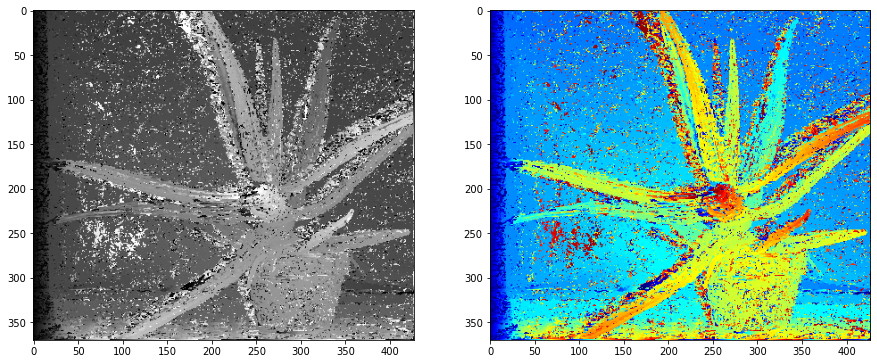

In [33]:
disparity_map4, color_disparity_map4 = window_based_matching_using_cosine(left_img, right_img, 64, kernel_size=3)
color_disparity_map4 = cv.cvtColor(color_disparity_map4, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map4, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map4)
plt.show()

Compute disparity map using window based matching with cosine similarity...
Saving result...
Done


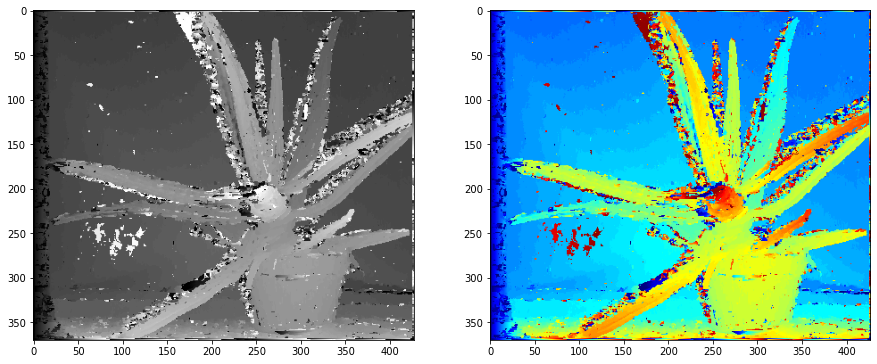

In [44]:
disparity_map4, color_disparity_map4 = window_based_matching_using_cosine(left_img, right_img, 64, kernel_size=5)
color_disparity_map4 = cv.cvtColor(color_disparity_map4, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map4, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map4)
plt.show()

In [38]:
left_img = './Aloe/Aloe_left_1.png'
right_img = './Aloe/Aloe_right_3.png'

Compute disparity map using window based matching with cosine similarity...
Saving result...
Done


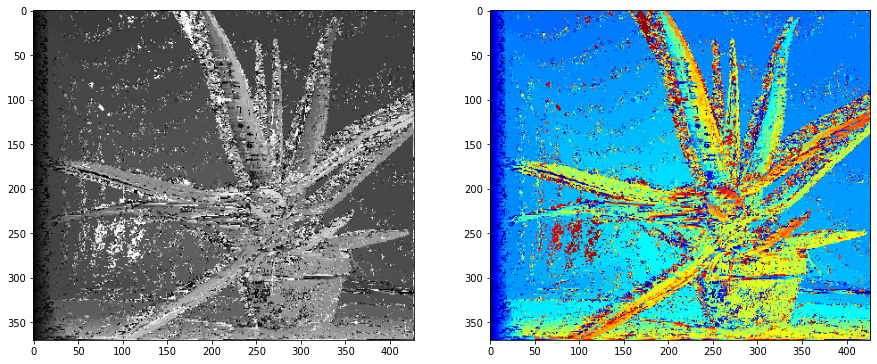

In [39]:
disparity_map4, color_disparity_map4 = window_based_matching_using_cosine(left_img, right_img, 64, kernel_size=3)
color_disparity_map4 = cv.cvtColor(color_disparity_map4, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map4, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map4)
plt.show()

# Problem 5

In [27]:
def compute_integral(array):
    integral = np.cumsum(array, axis=0)
    integral = np.cumsum(integral, axis=1)
    return integral

In [45]:
def window_based_matching_using_correlation(left_img, right_img, disparity_range, kernel_size=5, save_result=True):
    print('Compute disparity map using window based matching with correlation coefficience...')
    image_L = cv.imread(left_img, 0).astype(np.float64)
    image_R = cv.imread(right_img, 0).astype(np.float64)

    height, width = image_L.shape
    scale = 255/disparity_range
    side = int((kernel_size - 1)/2)

    cost_map = np.full((height, width, disparity_range), 255, dtype=np.float64)

    for d in range(disparity_range):
        cost_map[:,d:width,d] = image_R[:, 0:width-d]

    XY = cost_map * image_L.reshape((height, width, 1))
    integral = compute_integral(XY)
    integral = np.vstack((np.zeros((1, width, disparity_range)), integral))
    integral = np.hstack((np.zeros((height+1, 1, disparity_range)), integral))
    XY[0+side:height-side, 0+side:width-side, :] = integral[0+2*side+1:height+1, 0+2*side+1:width+1, :]
    XY[0+side:height-side, 0+side:width-side, :] -= integral[0:height-2*side, 0+2*side+1:width+1, :]
    XY[0+side:height-side, 0+side:width-side, :] -= integral[0+2*side+1:height+1, 0:width-2*side, :]
    XY[0+side:height-side, 0+side:width-side, :] += integral[0:height-2*side, 0:width-2*side, :]

    X = np.copy(image_L)
    integral = compute_integral(X)
    integral = np.vstack((np.zeros((1, width)), integral))
    integral = np.hstack((np.zeros((height+1, 1)), integral))
    X[0+side:height-side, 0+side:width-side] = integral[0+2*side+1:height+1, 0+2*side+1:width+1]
    X[0+side:height-side, 0+side:width-side] -= integral[0:height-2*side, 0+2*side+1:width+1]
    X[0+side:height-side, 0+side:width-side] -= integral[0+2*side+1:height+1, 0:width-2*side]
    X[0+side:height-side, 0+side:width-side] += integral[0:height-2*side, 0:width-2*side]
    X = X.reshape((height, width, 1))

    Y = np.copy(cost_map)
    integral = compute_integral(Y)
    integral = np.vstack((np.zeros((1, width, disparity_range)), integral))
    integral = np.hstack((np.zeros((height+1, 1, disparity_range)), integral))
    Y[0+side:height-side, 0+side:width-side, :] = integral[0+2*side+1:height+1, 0+2*side+1:width+1, :]
    Y[0+side:height-side, 0+side:width-side, :] -= integral[0:height-2*side, 0+2*side+1:width+1, :]
    Y[0+side:height-side, 0+side:width-side, :] -= integral[0+2*side+1:height+1, 0:width-2*side, :]
    Y[0+side:height-side, 0+side:width-side, :] += integral[0:height-2*side, 0:width-2*side, :]

    XX = image_L * image_L
    integral = compute_integral(XX)
    integral = np.vstack((np.zeros((1, width)), integral))
    integral = np.hstack((np.zeros((height+1, 1)), integral))
    XX[0+side:height-side, 0+side:width-side] = integral[0+2*side+1:height+1, 0+2*side+1:width+1]
    XX[0+side:height-side, 0+side:width-side] -= integral[0:height-2*side, 0+2*side+1:width+1]
    XX[0+side:height-side, 0+side:width-side] -= integral[0+2*side+1:height+1, 0:width-2*side]
    XX[0+side:height-side, 0+side:width-side] += integral[0:height-2*side, 0:width-2*side]
    XX = XX.reshape((height, width, 1))

    YY = cost_map * cost_map
    integral = compute_integral(YY)
    integral = np.vstack((np.zeros((1, width, disparity_range)), integral))
    integral = np.hstack((np.zeros((height+1, 1, disparity_range)), integral))
    YY[0+side:height-side, 0+side:width-side, :] = integral[0+2*side+1:height+1, 0+2*side+1:width+1, :]
    YY[0+side:height-side, 0+side:width-side, :] -= integral[0:height-2*side, 0+2*side+1:width+1, :]
    YY[0+side:height-side, 0+side:width-side, :] -= integral[0+2*side+1:height+1, 0:width-2*side, :]
    YY[0+side:height-side, 0+side:width-side, :] += integral[0:height-2*side, 0:width-2*side, :]

    cost_map = ((kernel_size**2)*XY - X*Y) / (np.sqrt((kernel_size**2)*XX - X**2)*np.sqrt((kernel_size**2)*YY - Y**2) + 0.000001)

    disparity_map = np.uint8(np.argmax(cost_map, axis=2) * scale)
    color_disparity_map = cv.applyColorMap(disparity_map, cv.COLORMAP_JET)

    if save_result == True:
        print('Saving result...')
        cv.imwrite('disparity_map_4.png', disparity_map)
        cv.imwrite('color_disparity_map_4.png', color_disparity_map)
    else:
        ...
    
    print('Done')
    return disparity_map, color_disparity_map

In [46]:
left_img = './Aloe/Aloe_left_1.png'
right_img = './Aloe/Aloe_right_2.png'

Compute disparity map using window based matching with correlation coefficience...
Saving result...
Done


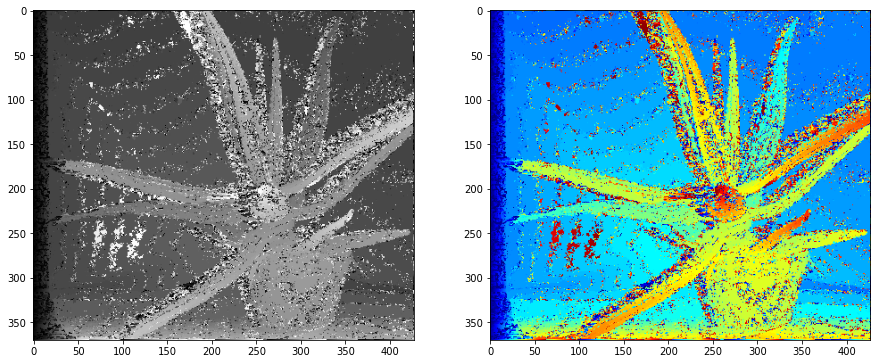

In [47]:
disparity_map5, color_disparity_map5 = window_based_matching_using_correlation(left_img, right_img, 64, kernel_size=3)
color_disparity_map5 = cv.cvtColor(color_disparity_map5, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map5, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map5)
plt.show()

Compute disparity map using window based matching with correlation coefficience...
Saving result...
Done


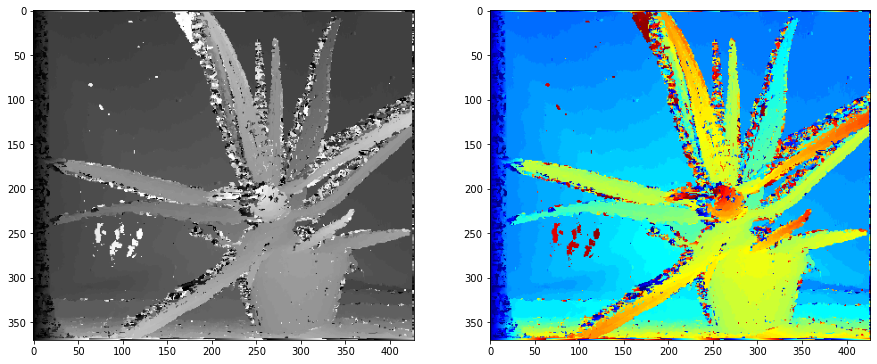

In [48]:
disparity_map5, color_disparity_map5 = window_based_matching_using_correlation(left_img, right_img, 64, kernel_size=5)
color_disparity_map5 = cv.cvtColor(color_disparity_map5, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map5, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map5)
plt.show()

In [49]:
left_img = './Aloe/Aloe_left_1.png'
right_img = './Aloe/Aloe_right_3.png'

Compute disparity map using window based matching with correlation coefficience...
Saving result...
Done


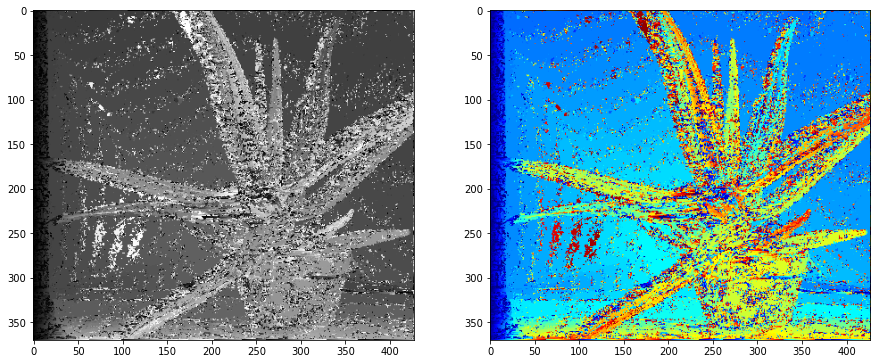

In [50]:
disparity_map5, color_disparity_map5 = window_based_matching_using_correlation(left_img, right_img, 64, kernel_size=3)
color_disparity_map5 = cv.cvtColor(color_disparity_map5, cv.COLOR_BGR2RGB)

# Visualize
fig = plt.figure(figsize=(15, 15))
fig.add_subplot(1, 2, 1)
plt.imshow(disparity_map5, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(color_disparity_map5)
plt.show()